# **Exploratory Analysis - Terrorism**

--------------------------------------------------------------------------------------

Data Set: https://www.kaggle.com/datasets/itssuru/global-terrorism

------------------------------------------------------------------------------------

### ***1. Importing Dependencies***

In [2]:
import numpy as np #provides a high-performance multidimensional array object
import pandas as pd #allows us to perform analysis of big data
import matplotlib as mpl #data visualization library
import matplotlib.pyplot as plt #used for data visualization and plotting on graphs
import seaborn as sns #library for making statistical graphics
import sklearn
import warnings
import os
import mpl_toolkits
import json
import pygal
%matplotlib inline

In [3]:
from sklearn.cluster import KMeans
from pandas.plotting import scatter_matrix

### ***2. Data Collecting***

In [4]:
df_terrorism = pd.read_csv("C:\\Users\\zeelt\\Desktop\\Python Projects\\Global Terrorism\\globalterrorismdb_0718dist.csv", on_bad_lines='skip',encoding="latin1", low_memory=False)
pd.set_option("display.max_columns",500)
df_terrorism

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

In [5]:
df_terrorism.shape

(181691, 135)

 ### ***3. Cleaning Data***

##### **--->Selection of Required Columns**

In [6]:
#extracting columns and storing in cols variable
use_cols = [1, 5, 8, 10,11,12,13,14,25,26,27,29,35,58,69,71,82,98,100,101,103,104,106]
rename_cols= {'latitude' : 'lat',
              'longitude' : 'lon',
              'iyear': u'year',
              'country_txt': u'country',
              'region_txt':'region',
              'attacktype1_txt': u'attacktype',
              'targtype1_txt': u'targtype',
              'weaptype1_txt':'weaptype',
              'nperps': u'nter',
              'nkill': u'killed',
              'nkillter': u'killedter',
              'nwound': u'wounded',
              'nwoundte': u'woundedter',
              'propextent_txt': u'propertyextent',
              }

##### ***---> Rereading data with new filtered column values***

In [7]:
import pandas as pd

# Read the CSV file into a DataFrame
df_terrorism = pd.read_csv(
    "C:\\Users\\zeelt\\Desktop\\Python Projects\\Global Terrorism\\globalterrorismdb_0718dist.csv", 
    on_bad_lines='skip',
    encoding="ISO-8859-1", 
    usecols=use_cols, 
    low_memory=False
)

# Rename the columns
df_terrorism.rename(columns=rename_cols, inplace=True)

# Apply the lambda function to strip strings
df_terrorism = df_terrorism.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# Print success message
print("Data Read Successfully")


Data Read Successfully


In [8]:
df_terrorism.columns

Index(['year', 'extended', 'country', 'region', 'provstate', 'city', 'lat',
       'lon', 'multiple', 'success', 'suicide', 'attacktype', 'targtype',
       'gname', 'nter', 'claimed', 'weaptype', 'killed', 'killedter',
       'wounded', 'woundedter', 'property', 'propertyextent'],
      dtype='object')

In [9]:
df_terrorism.shape

(181691, 23)

##### ***---> Removing unknown values from coordinates*** 

In [10]:
df_terrorism = df_terrorism[pd.notnull(df_terrorism.lat)]
df_terrorism = df_terrorism[pd.notnull(df_terrorism.lon)]

##### ***---> Unknown values in numeric columns*** 

In [11]:
# We dont want any NaN's as they automatically convert the column to dtype=float
exclude_cols = ['year', 'lat', 'lon']
float_cols = [c for c in df_terrorism.select_dtypes(include=[float]).columns.tolist() if c not in exclude_cols]

##### ***---> Calculating and Cleaning Duplicate Values*** 

In [12]:
df_terrorism.duplicated().sum()

21123

In [13]:
df_terrorism.drop_duplicates(keep=False,inplace=True)

##### ***---> Calculating and Cleaning Null Values*** 

In [14]:
df_terrorism.isnull().sum()

year                  0
extended              0
country               0
region                0
provstate           409
city                367
lat                   0
lon                   0
multiple              1
success               0
suicide               0
attacktype            0
targtype              0
gname                 0
nter              51729
claimed           47212
weaptype              0
killed             7555
killedter         48051
wounded           12494
woundedter        50093
property              0
propertyextent    94965
dtype: int64

In [15]:
df_terrorism.fillna(0, inplace=True)

In [16]:
df_terrorism.isnull().sum()

year              0
extended          0
country           0
region            0
provstate         0
city              0
lat               0
lon               0
multiple          0
success           0
suicide           0
attacktype        0
targtype          0
gname             0
nter              0
claimed           0
weaptype          0
killed            0
killedter         0
wounded           0
woundedter        0
property          0
propertyextent    0
dtype: int64

 ### ***4. Exploratory Data Analysis***

In [17]:
df_terrorism.columns

Index(['year', 'extended', 'country', 'region', 'provstate', 'city', 'lat',
       'lon', 'multiple', 'success', 'suicide', 'attacktype', 'targtype',
       'gname', 'nter', 'claimed', 'weaptype', 'killed', 'killedter',
       'wounded', 'woundedter', 'property', 'propertyextent'],
      dtype='object')

##### ***---> Displaying data type of all columns and converting type for those needed*** 

In [18]:
df_terrorism.dtypes

year                int64
extended            int64
country            object
region             object
provstate          object
city               object
lat               float64
lon               float64
multiple          float64
success             int64
suicide             int64
attacktype         object
targtype           object
gname              object
nter              float64
claimed           float64
weaptype           object
killed            float64
killedter         float64
wounded           float64
woundedter        float64
property            int64
propertyextent     object
dtype: object

In [19]:
df_terrorism['multiple'] = df_terrorism['multiple'].astype(int)
df_terrorism['nter'] = df_terrorism['nter'].astype(int)
df_terrorism['claimed'] = df_terrorism['claimed'].astype(int)
df_terrorism['killed'] = df_terrorism['killed'].astype(int)
df_terrorism['killedter'] = df_terrorism['killedter'].astype(int)
df_terrorism['wounded'] = df_terrorism['wounded'].astype(int)
df_terrorism['woundedter'] = df_terrorism['woundedter'].astype(int)

In [20]:
df_terrorism.dtypes

year                int64
extended            int64
country            object
region             object
provstate          object
city               object
lat               float64
lon               float64
multiple            int32
success             int64
suicide             int64
attacktype         object
targtype           object
gname              object
nter                int32
claimed             int32
weaptype           object
killed              int32
killedter           int32
wounded             int32
woundedter          int32
property            int64
propertyextent     object
dtype: object

In [21]:
df_terrorism.info()

<class 'pandas.core.frame.DataFrame'>
Index: 146986 entries, 0 to 181690
Data columns (total 23 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   year            146986 non-null  int64  
 1   extended        146986 non-null  int64  
 2   country         146986 non-null  object 
 3   region          146986 non-null  object 
 4   provstate       146986 non-null  object 
 5   city            146986 non-null  object 
 6   lat             146986 non-null  float64
 7   lon             146986 non-null  float64
 8   multiple        146986 non-null  int32  
 9   success         146986 non-null  int64  
 10  suicide         146986 non-null  int64  
 11  attacktype      146986 non-null  object 
 12  targtype        146986 non-null  object 
 13  gname           146986 non-null  object 
 14  nter            146986 non-null  int32  
 15  claimed         146986 non-null  int32  
 16  weaptype        146986 non-null  object 
 17  killed         

##### ***---> Count values in each column*** 

In [22]:
df_terrorism.count()

year              146986
extended          146986
country           146986
region            146986
provstate         146986
city              146986
lat               146986
lon               146986
multiple          146986
success           146986
suicide           146986
attacktype        146986
targtype          146986
gname             146986
nter              146986
claimed           146986
weaptype          146986
killed            146986
killedter         146986
wounded           146986
woundedter        146986
property          146986
propertyextent    146986
dtype: int64

In [23]:
df_terrorism.nunique()

year                 47
extended              2
country             204
region               12
provstate          2823
city              34806
lat               47873
lon               47588
multiple              2
success               2
suicide               2
attacktype            9
targtype             22
gname              3401
nter                109
claimed               3
weaptype             12
killed              201
killedter            96
wounded             237
woundedter           44
property              3
propertyextent        5
dtype: int64

##### ***---> Year values in the dataset*** 

In [24]:
df_terrorism['year'].unique()

array([1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980,
       1981, 1986, 1982, 1983, 1984, 1985, 1987, 1988, 1989, 1990, 1991,
       1992, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017], dtype=int64)

In [25]:
df_terrorism['year'].value_counts()

year
2014    14303
2015    12449
2016    11060
2013    10435
2017     9665
2012     7604
2008     4333
2009     4169
2011     4167
2010     4103
1992     3753
1991     3236
1989     3163
2007     2925
1988     2792
1994     2637
1990     2572
2006     2542
1984     2279
1997     2267
1983     2166
1996     2146
1987     2085
1981     2021
1980     1998
1995     1998
1982     1961
1979     1949
1986     1946
1985     1923
2005     1901
2001     1782
2000     1643
2002     1244
1999     1239
1978     1205
2003     1186
2004     1104
1977      986
1998      826
1976      688
1975      575
1970      518
1974      424
1971      366
1973      349
1972      303
Name: count, dtype: int64

##### ***---> Count of Regions in the dataset*** 

In [26]:
df_terrorism['region'].value_counts()

region
South Asia                     39971
Middle East & North Africa     39491
Sub-Saharan Africa             15423
South America                  12978
Western Europe                 12285
Southeast Asia                 10980
Central America & Caribbean     6995
Eastern Europe                  4599
North America                   2879
East Asia                        628
Central Asia                     498
Australasia & Oceania            259
Name: count, dtype: int64

##### ***---> Count of Cities in the dataset*** 

In [27]:
df_terrorism['city'].value_counts()

city
Unknown       5760
Baghdad       4106
Karachi       1493
Mosul         1455
Mogadishu     1250
              ... 
Koh Mak          1
Shambuko         1
Baladweyne       1
Riverine         1
Kubentog         1
Name: count, Length: 34806, dtype: int64

##### ***---> Count of Terrorist group names in the dataset*** 

In [28]:
df_terrorism['gname'].value_counts()

gname
Unknown                                              66397
Taliban                                               7135
Islamic State of Iraq and the Levant (ISIL)           4641
Al-Shabaab                                            2892
Shining Path (SL)                                     2758
                                                     ...  
Shahin (Falcon)                                          1
Militant Movement for Madagascan Socialism (MMSM)        1
BZers                                                    1
Basic People's Congresses                                1
Panama Defense Force                                     1
Name: count, Length: 3401, dtype: int64

##### ***---> Count of Attack Types in the dataset*** 

In [29]:
df_terrorism['attacktype'].value_counts()

attacktype
Bombing/Explosion                      67298
Armed Assault                          36845
Assassination                          16348
Hostage Taking (Kidnapping)            10018
Facility/Infrastructure Attack          7878
Unknown                                 6303
Hostage Taking (Barricade Incident)      846
Unarmed Assault                          844
Hijacking                                606
Name: count, dtype: int64

##### ***---> Count of Target Types in the dataset*** 

In [30]:
df_terrorism['targtype'].value_counts()

targtype
Private Citizens & Property       34737
Military                          24514
Police                            21594
Government (General)              17536
Business                          14623
Transportation                     5309
Unknown                            4096
Religious Figures/Institutions     3875
Educational Institution            3497
Government (Diplomatic)            3128
Utilities                          2896
Terrorists/Non-State Militia       2778
Journalists & Media                2541
Violent Political Party            1644
Airports & Aircraft                1226
NGO                                 908
Telecommunication                   809
Tourists                            397
Maritime                            285
Food or Water Supply                266
Abortion Related                    203
Other                               124
Name: count, dtype: int64

#### **Statistical Summary of Data**

In [31]:
df_terrorism.describe()

,year,extended,lat,lon,multiple,success,suicide,nter,claimed,killed,killedter,wounded,woundedter,property
count,146986.000000,146986.000000,146986.000000,1.469860e+05,146986.000000,146986.000000,146986.000000,146986.000000,146986.000000,146986.000000,146986.000000,146986.000000,146986.000000,146986.000000
mean,2003.593499,0.050590,23.688252,-5.548676e+02,0.086716,0.886499,0.043460,-42.688957,0.033398,2.578225,0.383615,3.312152,0.079967,-0.596417
std,12.936236,0.219159,17.899265,2.248011e+05,0.281419,0.317205,0.203891,108.563825,0.934334,12.194752,3.697621,38.061656,1.298710,3.148533
min,1970.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000,0.000000,-99.000000,-9.000000,0.000000,0.000000,0.000000,0.000000,-9.000000
25%,1992.000000,0.000000,11.400638,8.808213e+00,0.000000,1.000000,0.000000,-99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2010.000000,0.000000,31.322678,4.376645e+01,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2014.000000,0.000000,34.621521,6.980546e+01,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,0.000000,2.000000,0.000000,1.000000
max,2017.000000,1.000000,74.633553,1.793667e+02,1.000000,1.000000,1.000000,25000.000000,1.000000,1570.000000,500.000000,8191.000000,200.000000,1.000000


#### **Correlation among the columns**

In [32]:
# Select only numeric columns
numeric_df = df_terrorism.select_dtypes(include=[float, int])

# Calculate correlation matrix
corr_values = numeric_df.corr()
corr_values

,year,extended,lat,lon,multiple,success,suicide,nter,claimed,killed,killedter,wounded,woundedter,property
year,1.000000,0.087284,0.139096,0.004487,0.193094,-0.057795,0.137812,-0.311391,0.078669,0.015626,0.073930,0.011550,0.048757,-0.248604
extended,0.087284,1.000000,-0.030879,0.000609,0.003550,0.078878,-0.041591,-0.028576,0.008195,0.011553,0.009054,-0.011720,0.003929,0.001607
lat,0.139096,-0.030879,1.000000,0.001662,0.016759,-0.060591,0.074789,-0.075284,0.018524,-0.018130,0.013955,0.015584,0.024175,-0.067313
lon,0.004487,0.000609,0.001662,1.000000,0.000824,-0.000942,0.000571,-0.001061,0.000097,-0.000520,0.000278,0.000231,0.000168,-0.001360
multiple,0.193094,0.003550,0.016759,0.000824,1.000000,0.011408,0.063561,-0.065299,0.050722,0.029170,0.033471,0.025853,0.017624,-0.079118
success,-0.057795,0.078878,-0.060591,-0.000942,0.011408,1.000000,-0.029239,0.025294,-0.004817,0.052270,-0.022147,0.024457,-0.014449,-0.037473
suicide,0.137812,-0.041591,0.074789,0.000571,0.063561,-0.029239,1.000000,0.057148,0.038451,0.133932,0.100651,0.094581,0.005092,-0.073900
nter,-0.311391,-0.028576,-0.075284,-0.001061,-0.065299,0.025294,0.057148,1.000000,-0.053815,0.032582,0.008837,0.017312,-0.001160,0.083877
claimed,0.078669,0.008195,0.018524,0.000097,0.050722,-0.004817,0.038451,-0.053815,1.000000,0.013441,0.028469,0.005461,0.021594,0.040990
killed,0.015626,0.011553,-0.018130,-0.000520,0.029170,0.052270,0.133932,0.032582,0.013441,1.000000,0.351714,0.449810,0.110741,-0.014897


#### **Covariance between set of Variables**

In [33]:
numerical_df = df_terrorism.select_dtypes(include=[float, int])
covariance_values = numerical_df.cov()
covariance_values

,year,extended,lat,lon,multiple,success,suicide,nter,claimed,killed,killedter,wounded,woundedter,property
year,167.346202,0.247459,32.207670,1.304927e+04,0.702958,-0.237158,0.363491,-437.320231,0.950856,2.465095,3.536334,5.687139,0.819138,-10.125665
extended,0.247459,0.048031,-0.121132,2.998204e+01,0.000219,0.005483,-0.001858,-0.679892,0.001678,0.030876,0.007337,-0.097759,0.001118,0.001109
lat,32.207670,-0.121132,320.383693,6.688909e+03,0.084419,-0.344017,0.272940,-146.292134,0.309800,-3.957379,0.923611,10.617033,0.561982,-3.793537
lon,13049.272898,29.982042,6688.908736,5.053552e+10,52.132551,-67.162296,26.170763,-25891.506262,20.394835,-1424.193236,230.959788,1973.006510,49.178114,-962.382776
multiple,0.702958,0.000219,0.084419,5.213255e+01,0.079197,0.001018,0.003647,-1.995010,0.013337,0.100105,0.034830,0.276915,0.006441,-0.070103
success,-0.237158,0.005483,-0.344017,-6.716230e+01,0.001018,0.100619,-0.001891,0.871042,-0.001428,0.202194,-0.025976,0.295273,-0.005952,-0.037426
suicide,0.363491,-0.001858,0.272940,2.617076e+01,0.003647,-0.001891,0.041571,1.264987,0.007325,0.333009,0.075882,0.733986,0.001348,-0.047441
nter,-437.320231,-0.679892,-146.292134,-2.589151e+04,-1.995010,0.871042,1.264987,11786.104136,-5.458706,43.135940,3.547284,71.534121,-0.163486,28.670542
claimed,0.950856,0.001678,0.309800,2.039484e+01,0.013337,-0.001428,0.007325,-5.458706,0.872981,0.153148,0.098356,0.194194,0.026203,0.120582
killed,2.465095,0.030876,-3.957379,-1.424193e+03,0.100105,0.202194,0.333009,43.135940,0.153148,148.711985,15.859341,208.780194,1.753863,-0.571969


 ### ***4. Visualization of Data***

####            **A. Heatmap of correlation values**

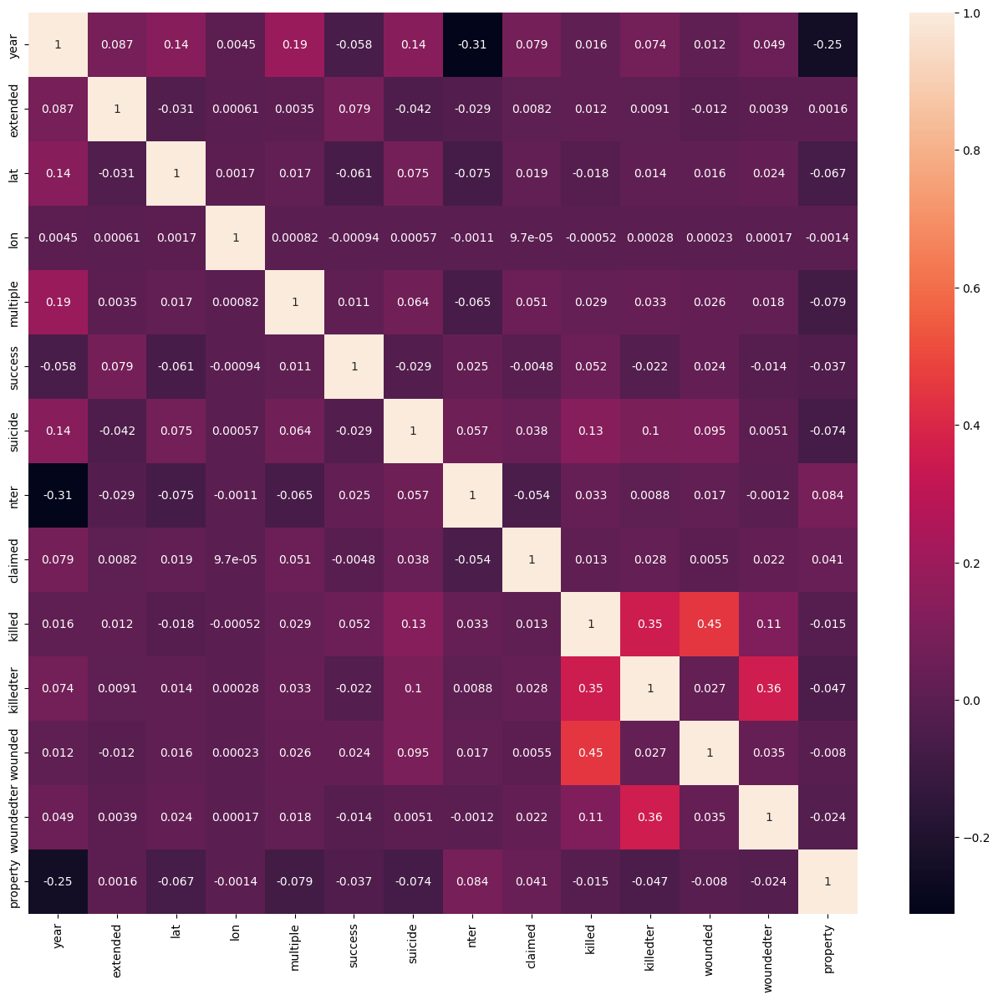

In [34]:
fig,axes = plt.subplots(1,1,figsize=(16,14))
sns.heatmap(corr_values, annot=True)
plt.show()

####            **B. Heatmap of correlation values**

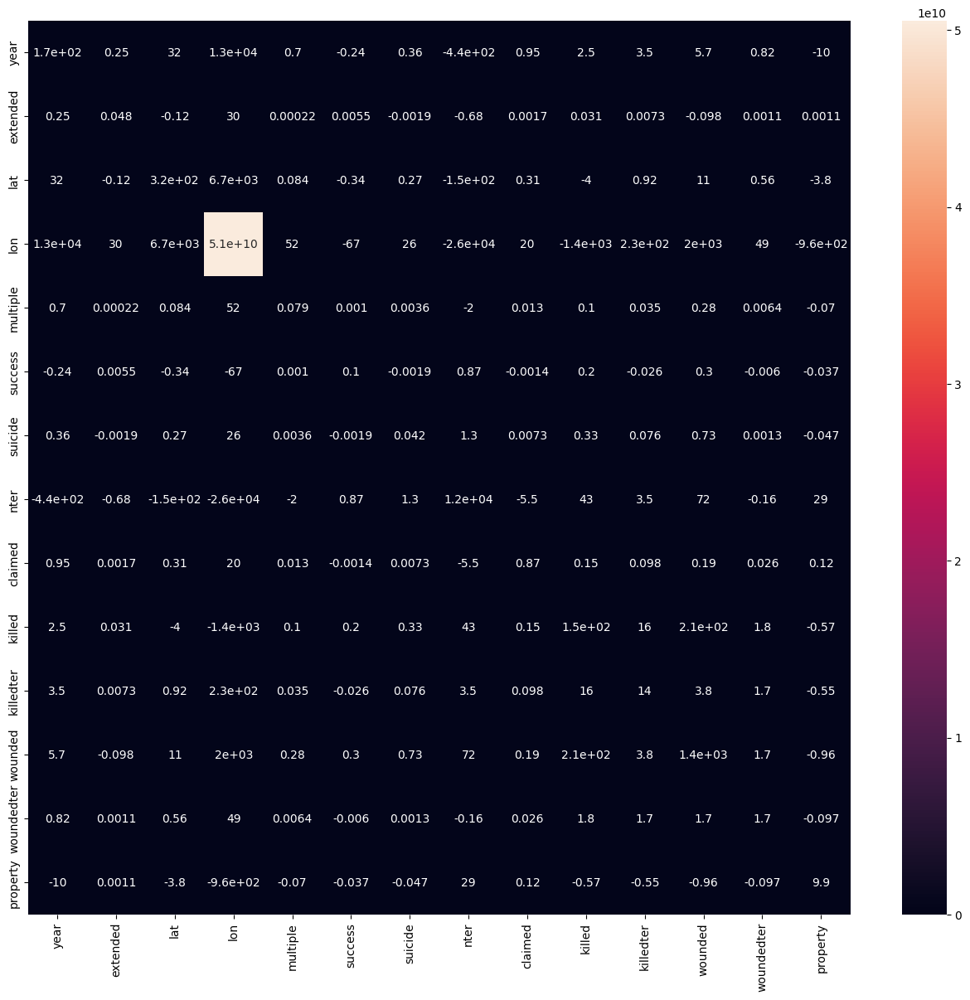

In [35]:
fig,axes = plt.subplots(1,1,figsize=(16,14))
sns.heatmap(covariance_values, annot=True)
plt.show()

#### **C. Pie Chart of Attack Types**

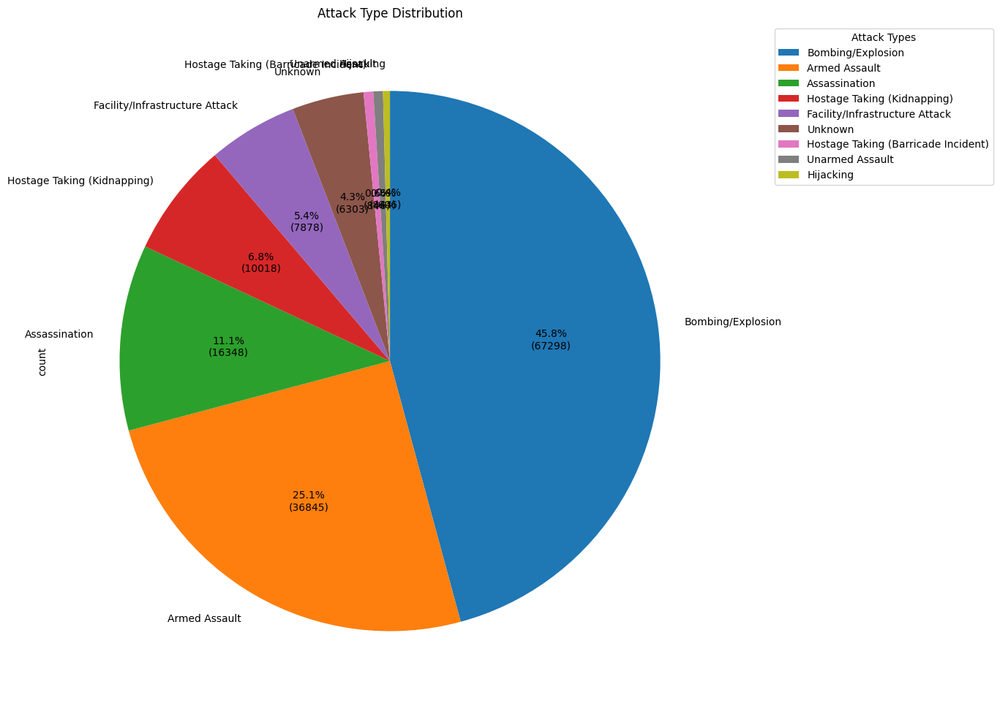

In [36]:
import matplotlib.pyplot as plt

# Create a function to format the labels
def autopct_format(values):
    def my_format(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return f'{pct:.1f}%\n({val:d})'
    return my_format

# Get the value counts for the 'attacktype' column
attacktype_counts = df_terrorism['attacktype'].value_counts()

# Increase the size of the figure
plt.figure(figsize=(12, 12))

# Plot the pie chart with values
attacktype_counts.plot.pie(autopct=autopct_format(attacktype_counts), startangle=90, counterclock=False)

# Set the title (optional)
plt.title('Attack Type Distribution')

plt.legend(attacktype_counts.index, title="Attack Types", loc="upper right", bbox_to_anchor=(1.4, 1))

# Display the plot
plt.show()


#### **D. Histogram of Target Types**

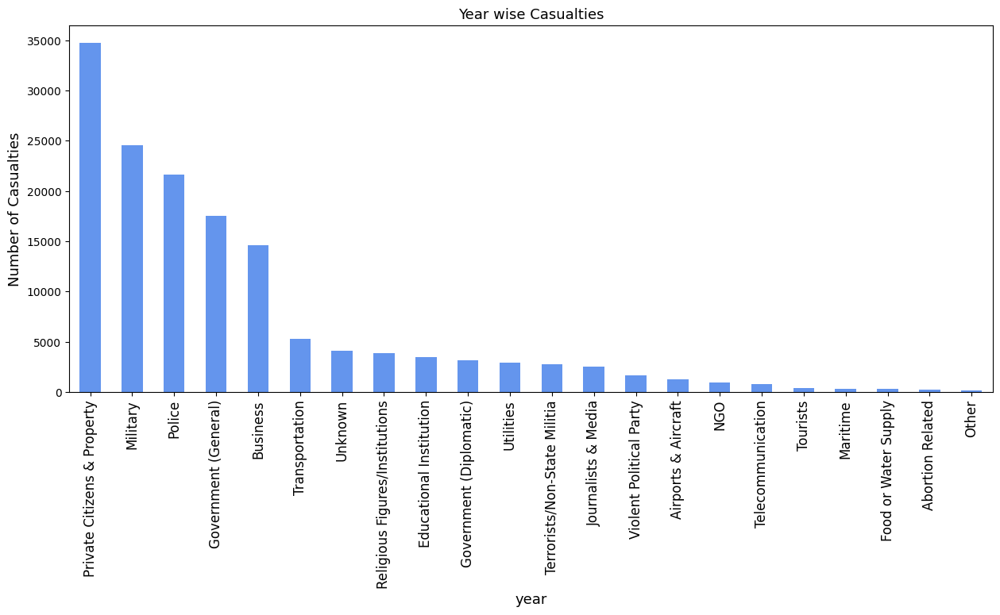

In [37]:
targettype_counts = df_terrorism['targtype'].value_counts()

targettype_counts.plot(kind="bar",color="cornflowerblue",figsize=(15,6))
plt.title("Year wise Casualties",fontsize=13)
plt.xlabel("year",fontsize=13)
plt.xticks(fontsize=12)
plt.ylabel("Number of Casualties",fontsize=13)
plt.show()

#### **E. Histogram of Weapon Types**

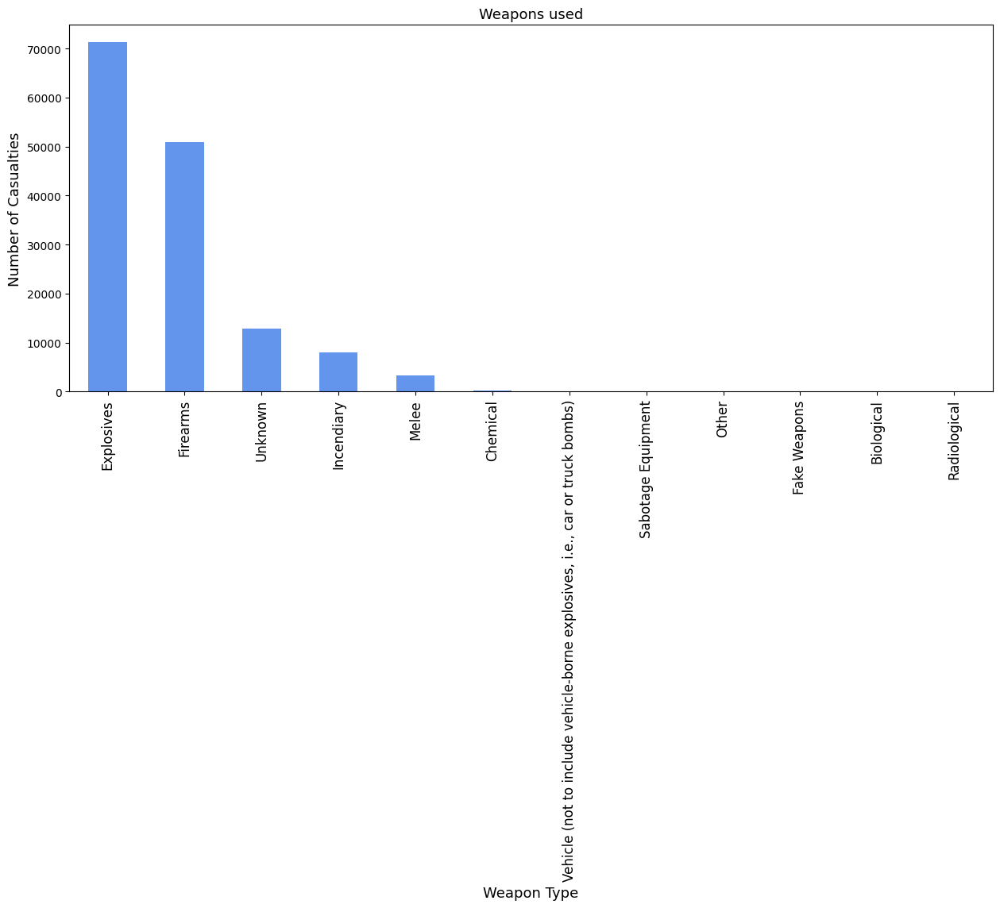

In [38]:
weapon_counts = df_terrorism['weaptype'].value_counts()

weapon_counts.plot(kind="bar",color="cornflowerblue",figsize=(15,6))
plt.title("Weapons used",fontsize=13)
plt.xlabel("Weapon Type",fontsize=13)
plt.xticks(fontsize=12)
plt.ylabel("Number of Casualties",fontsize=13)
plt.show()

#### **F. Heat Map of Region Affected**

In [39]:
region_counts = df_terrorism['region'].value_counts()
region_counts

region
South Asia                     39971
Middle East & North Africa     39491
Sub-Saharan Africa             15423
South America                  12978
Western Europe                 12285
Southeast Asia                 10980
Central America & Caribbean     6995
Eastern Europe                  4599
North America                   2879
East Asia                        628
Central Asia                     498
Australasia & Oceania            259
Name: count, dtype: int64

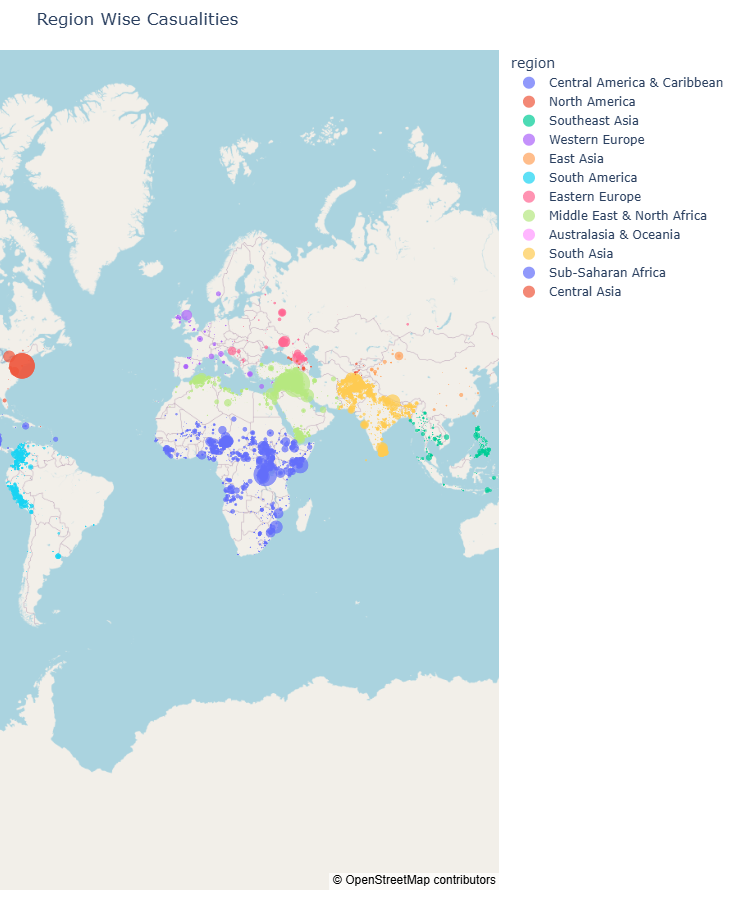

In [40]:
import plotly.express as px

fig = px.scatter_mapbox(df_terrorism,
                        lon = df_terrorism['lon'],
                        lat = df_terrorism['lat'],zoom = 2,
                        color = df_terrorism['region'],
                        size = df_terrorism['killed'],width = 1100, height = 900, title = 'Region Wise Casualities')

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(margin={"r":0, "t":50, "l": 0, "b": 10})

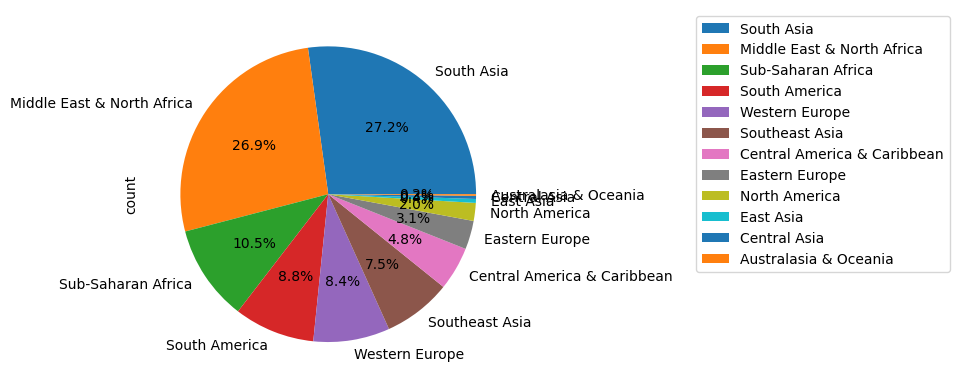

In [41]:
df_terrorism['region'].value_counts().plot.pie(autopct = "%1.1f%%")
plt.legend(loc='upper right', bbox_to_anchor=(2.2, 1))
plt.show()

#### **G. Number of Terrorist Activities Each Year**

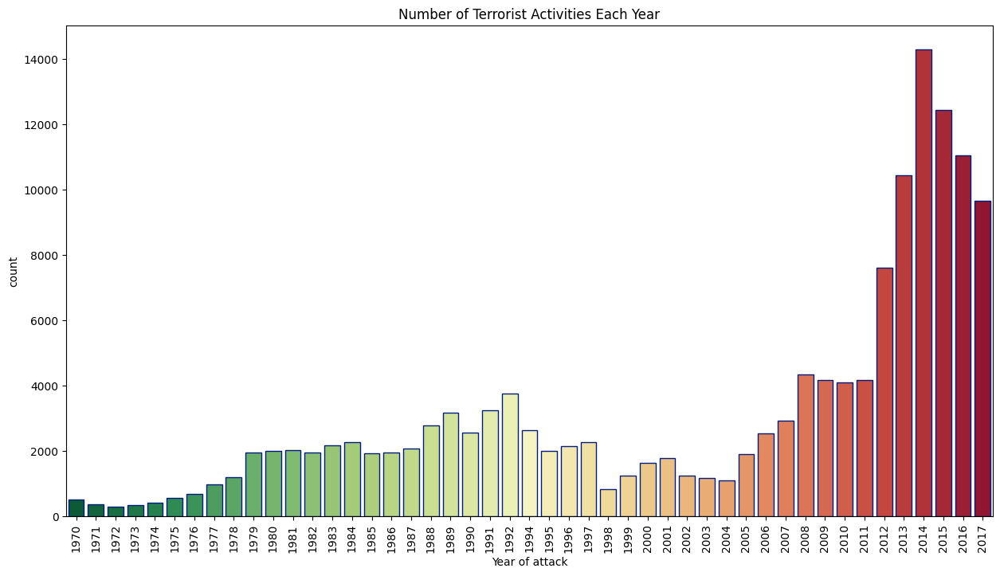

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure and axes
fig, ax = plt.subplots(figsize=(15, 8))

# Plot the countplot
sns.countplot(x='year', hue='year', data=df_terrorism, palette='RdYlGn_r', edgecolor=sns.color_palette('dark', 7), ax=ax, legend=False)
plt.xticks(rotation=90)
plt.xlabel('Year of attack')
plt.title('Number of Terrorist Activities Each Year')
plt.show()



#### **H. Frequency of Attacks**

Text(0, 0.5, 'Frequency of Attacks')

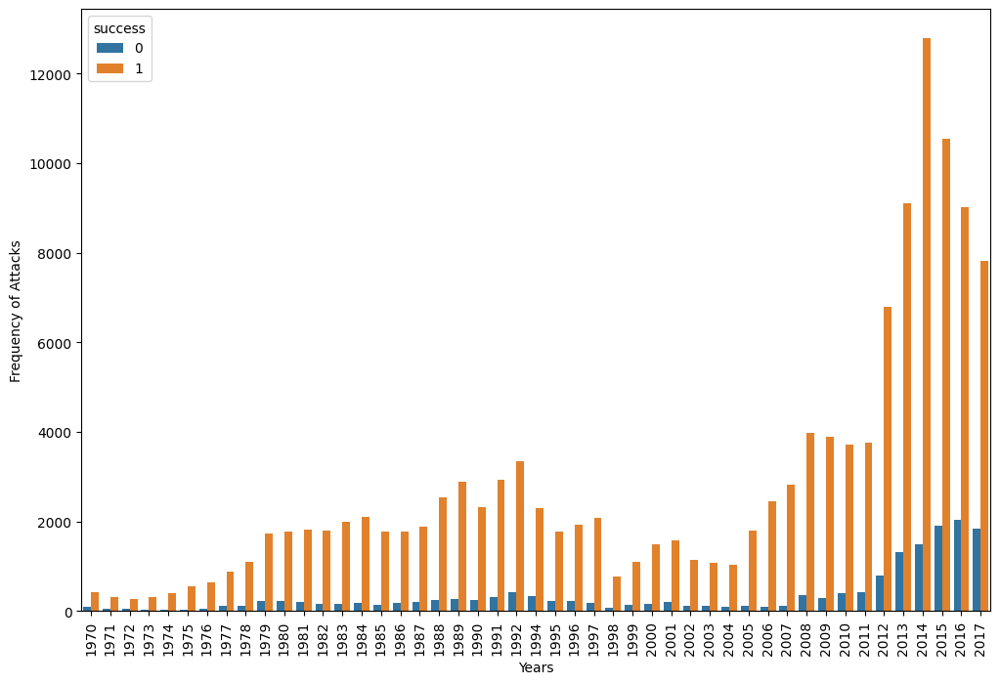

In [45]:
plt.figure(figsize=(12,8))
sns.countplot(x=df_terrorism['year'],hue='success',data = df_terrorism)
plt.xlabel('Years')
plt.xticks(rotation=90)
plt.ylabel('Frequency of Attacks')

#### **I. Number of Terrorist Activities Country Wise**

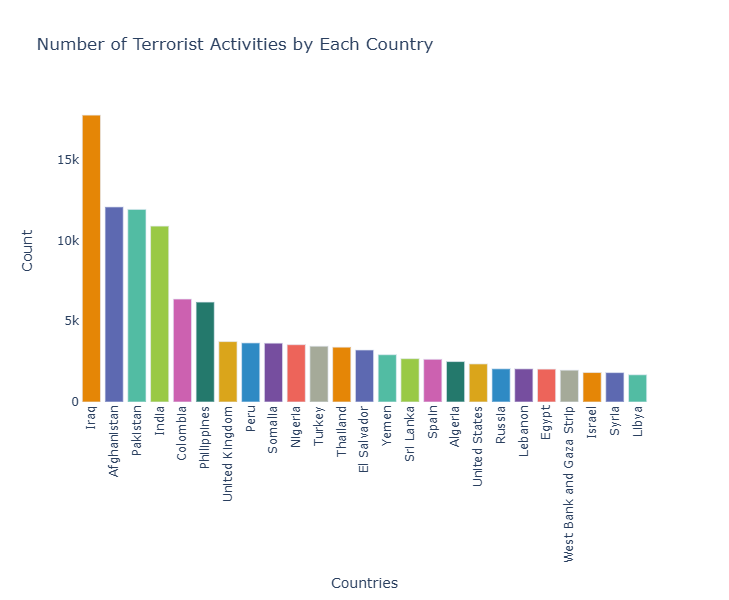

In [71]:
import pandas as pd
import plotly.express as px

country_counts = df_terrorism['country'].value_counts()[:25].reset_index()
country_counts.columns = ['Country', 'Count']

# Creating the bar plot with Plotly
fig = px.bar(country_counts, x='Country', y='Count', title="Number of Terrorist Activities by Each Country",
             labels={'Country': 'Countries', 'Count': 'Count'},
             hover_data={'Country': True, 'Count': True},
             color='Country',  # This assigns different colors to each country
             color_discrete_sequence=px.colors.qualitative.Vivid)  # You can choose any color palette here

# Updating layout for better visualization
fig.update_layout(
    xaxis_title="Countries",
    yaxis_title="Count",
    xaxis_tickangle=-90,
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    width=1060,  
    height=600,
    showlegend=False# Hide the legend
)

# Display the plot
fig.show()


#### **J. Number of Terrorist Activities Region Wise**

<Figure size 1500x800 with 0 Axes>

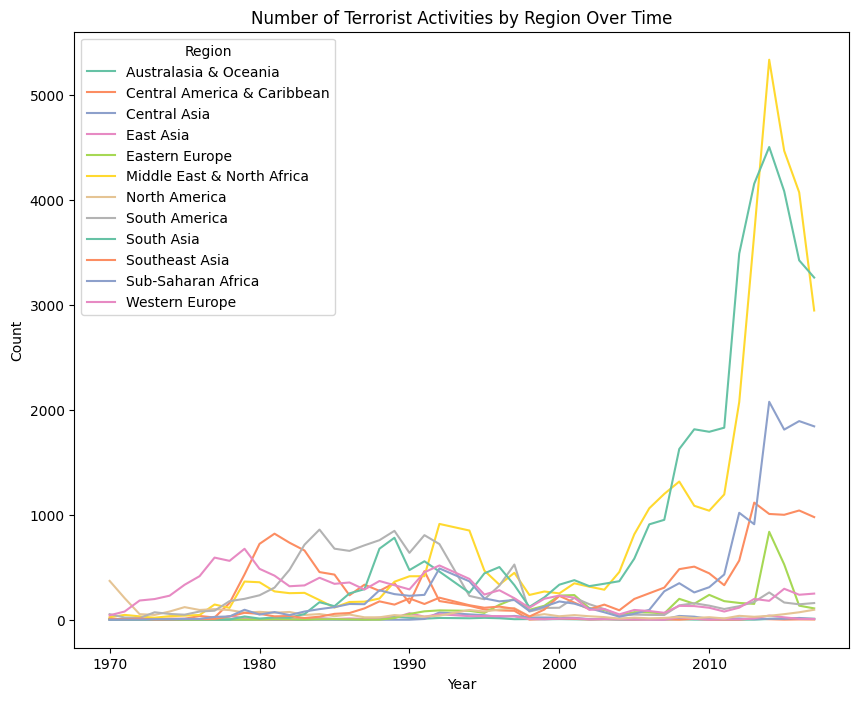

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Creating a crosstab DataFrame
df_region = pd.crosstab(df_terrorism.year, df_terrorism.region)

# Plotting the crosstab DataFrame with Seaborn and Matplotlib
plt.figure(figsize=(15, 8))  # Set the figure size
df_region.plot(color=sns.color_palette('Set2', 12))

# Setting labels and title
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Number of Terrorist Activities by Region Over Time')
plt.legend(title='Region', loc='upper left')

# Display the plot
plt.show()


#### **K. Number of People Wounded Year Wise**

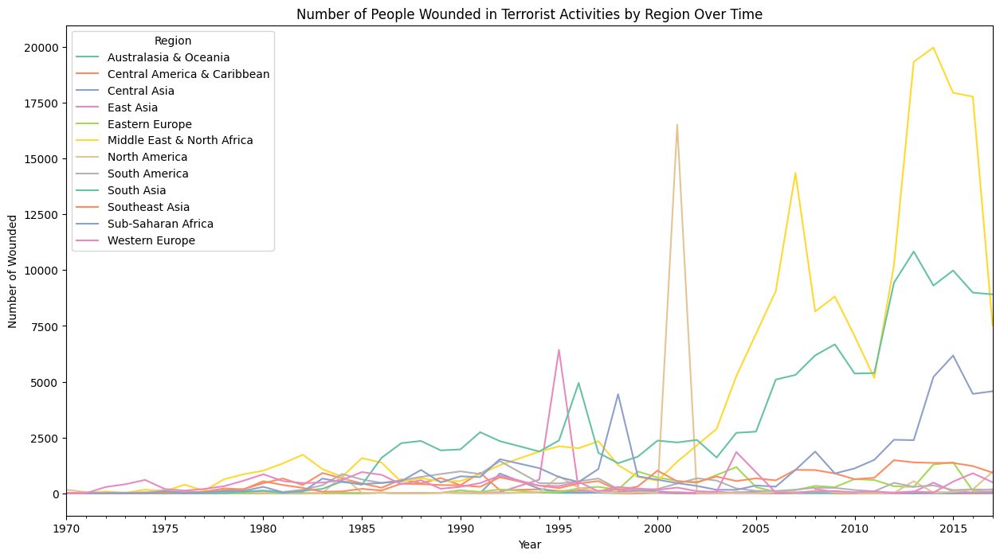

In [75]:
# Grouping by year and region, and summing the 'wounded' values
d = df_terrorism.groupby(['year', 'region'])['wounded'].sum()

# Unstacking the 'region' level to create a DataFrame suitable for plotting
plot_df_terrorism = d.unstack('region')

# Converting the index to a PeriodIndex with yearly frequency
plot_df_terrorism.index = pd.PeriodIndex(plot_df_terrorism.index.tolist(), freq='A')

# Plotting the DataFrame
plot_df_terrorism.plot(figsize=(15, 8), color=sns.color_palette('Set2', 12))

# Setting labels and title
plt.xlabel('Year')
plt.ylabel('Number of Wounded')
plt.title('Number of People Wounded in Terrorist Activities by Region Over Time')
plt.legend(title='Region', loc='upper left')

# Display the plot
plt.show()


#### **L. Histograms of Various Columns of Data Set**

array([[<Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'extended'}>,
        <Axes: title={'center': 'lat'}>, <Axes: title={'center': 'lon'}>],
       [<Axes: title={'center': 'multiple'}>,
        <Axes: title={'center': 'success'}>,
        <Axes: title={'center': 'suicide'}>,
        <Axes: title={'center': 'nter'}>],
       [<Axes: title={'center': 'claimed'}>,
        <Axes: title={'center': 'killed'}>,
        <Axes: title={'center': 'killedter'}>,
        <Axes: title={'center': 'wounded'}>],
       [<Axes: title={'center': 'woundedter'}>,
        <Axes: title={'center': 'property'}>, <Axes: >, <Axes: >]],
      dtype=object)

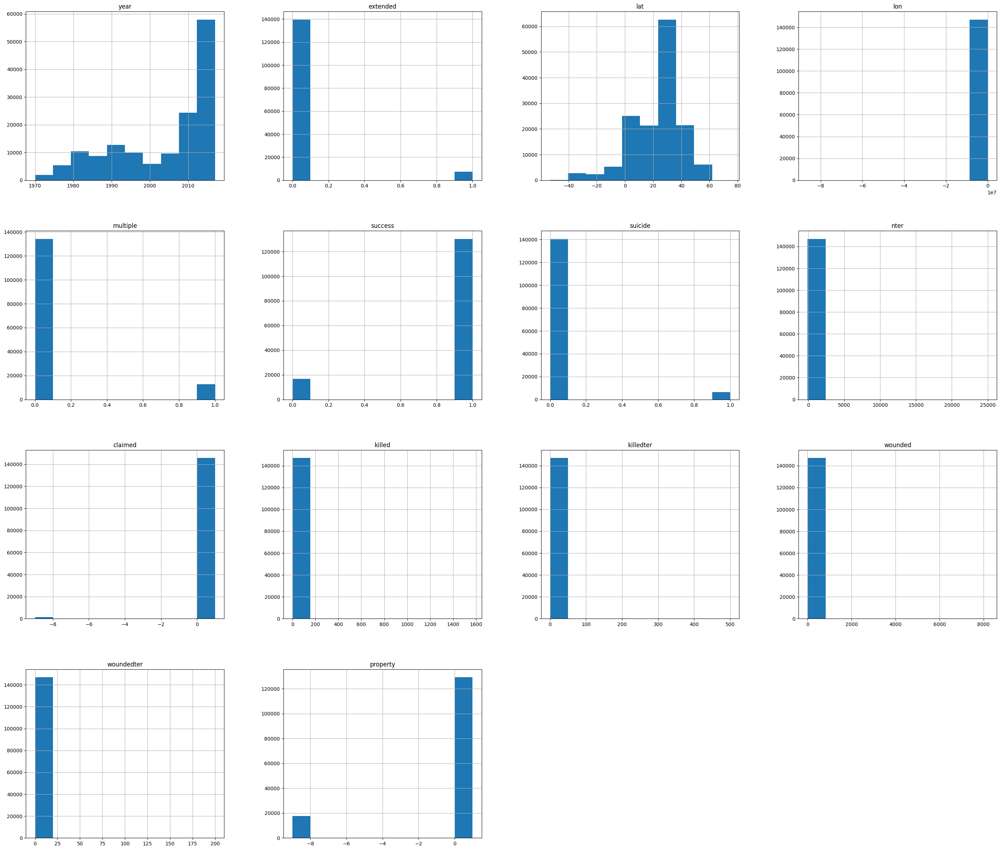

In [79]:
df_terrorism.hist(figsize=(35,30))

#### **M. Attack vs Killed Figure**

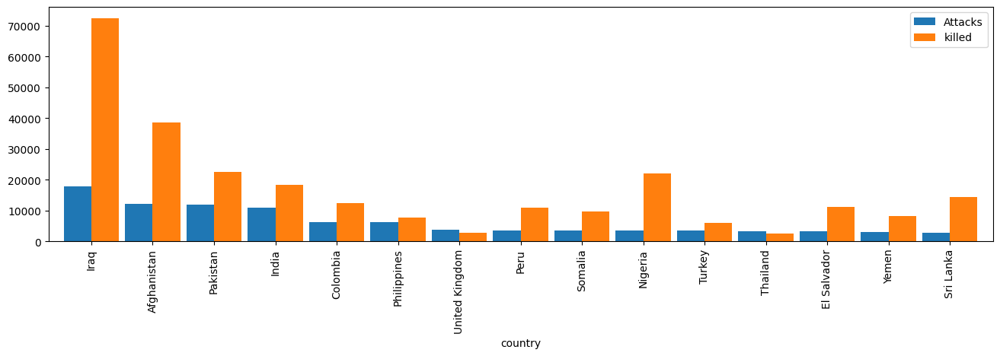

In [83]:
count_terror = df_terrorism['country'].value_counts()[:15].to_frame()
count_terror.columns=['Attacks']
count_kill=df_terrorism.groupby('country')['killed'].sum().to_frame()
count_terror.merge(count_kill,left_index = True, right_index = True, how='left').plot.bar(width=0.9)
fig=plt.gcf()
fig.set_size_inches(16,4)
plt.show()

## **CONCLUSION**

1. Country with Highest Number of Attacks : Iraq
2. Region with Highest Number of Terrorist Attacks : Middle East and North Africa
3. Maximum Number of People Killed : 1570 (In Iraq)
4. Year with Most Attacks : 2014
5. Month with Mose Attacks : May
6. Group that carried out most attacks : Taliban
7. Type of Attack most carried out : Bombing / Explosion